***Experiencia 1***

***Inciso a***

In [1]:
def funcion(arr,target):
    salida=[]
    vez=1
    for i in range(len(arr)):
        a=arr[i]
        for j in range(1,len(arr)):
            b=arr[j]
            if(a+b==target) and (j>i):
                salida.append(i)
                salida.append(j)
    return salida

***Inciso b)***

In [2]:

nums=[2,7,11,15]
suma=9
resul=funcion(nums,suma)
print(resul)

[0, 1]


In [3]:
nums=[3,2,4]
suma=6
resul=funcion(nums,suma)
print(resul)

[1, 2]


In [4]:
nums=[3,3]
suma=6
resul=funcion(nums,suma)
print(resul)

[0, 1]


***Inciso c)***

In [34]:
import numpy as np
#Tenemos nuestro limite
lim=100

#Creamos nustra lista aleatoria de numeros enteros de tamaño n
arr=[0]*lim
for i in range(lim):
    arr[i]=np.random.randint(lim)

#Generamos el target aleatorio 
target=np.random.randint(lim)
print(target)

63


***Inciso d)***

In [35]:
def funcion2(n):
    for i in n:
        indices=funcion(arr,target)
    
n1=[50,100,200]
funcion2(n1)     

***Inciso e) y f)***

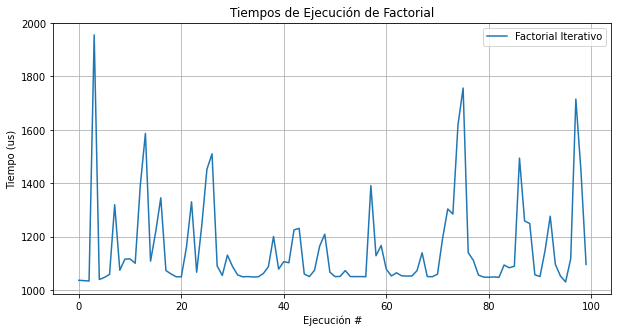

In [37]:
#Importamos la libreria time
import matplotlib.pyplot as plt
import time
# Número para el cual calcularemos la funcion
n = 100
n1=[50,100,200]
# Listas para guardar los tiempos de ejecución
times_iterative = []

# Realizamos 50 ejecuciones
for _ in range(n):
    # Medir tiempo para el método iterativo
    tic = time.perf_counter()
    funcion2(n1)
    toc = time.perf_counter()
    times_iterative.append(1e6*(toc - tic))

# Generar gráfica
plt.figure(figsize=(10, 5))
plt.plot(times_iterative, label='Factorial Iterativo')
plt.xlabel('Ejecución #')
plt.ylabel('Tiempo (us)')
plt.title('Tiempos de Ejecución de Factorial')
plt.grid()
plt.legend()
plt.show()
plt.close() 

***Inciso g)***

Obtenemos la siguiente gráfica en Colab

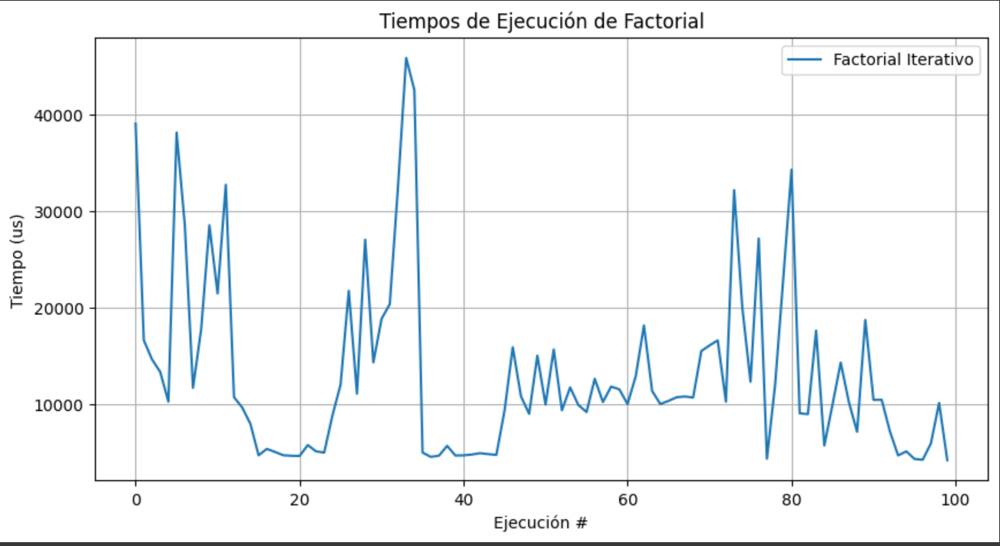  


***Inciso h)***

Como podemos observar en Google Colab tenemos una gráfica con la presencia de más pico o más inestable , sin embargo al ejecutar en la computadora local podemos que se mantiene ciertamente estable con la presencia de ciertos picos,en google colab podemos notar que el máximo pico toma el valor de mayor a 40 000 us, sin embargo en la computadora local es menor a 2000 us

***Experiencia 2***

***Inciso a)***

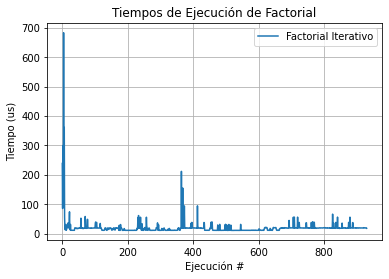

In [38]:
def benchmark_float_operations(size):
 a = np.random.rand(size)
 b = np.random.rand(size)
 return a * b


# Número para el cual calcularemos el factorial
size =np.random.randint(1000)

# Listas para guardar los tiempos de ejecución
times_iterative = []
# Realizamos 50 ejecuciones
for _ in range(size):

    tic = time.perf_counter()
    mul=benchmark_float_operations(size)
    toc = time.perf_counter()
    times_iterative.append(1e6*(toc - tic))

# Generar gráfica
plt.plot(times_iterative, label='Factorial Iterativo')
plt.xlabel('Ejecución #')
plt.ylabel('Tiempo (us)')
plt.title('Tiempos de Ejecución de Factorial')
plt.grid()
plt.legend()
plt.show()
plt.close()

***Inciso b)***

In [ ]:
import os
def benchmark_disk_io():
    var =np.random.randint(1000)
    data = 'a' * var * var # 1 MB de datos
    with open('test_file.txt', 'w') as f:
        for _ in range(10): # Escribe 10 MB de datos
            f.write(data)
    os.remove('test_file.txt')

***Inciso c)***

Creación del script en python 
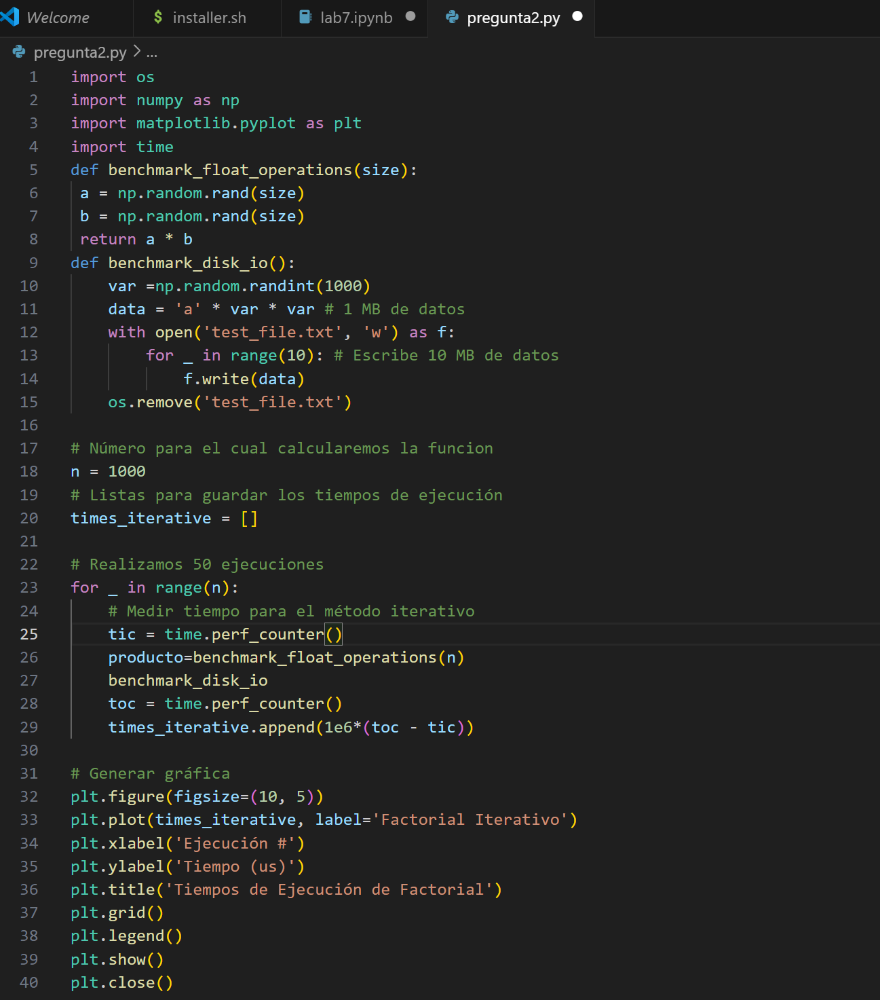

Gráfica obtenido en la computadora local:

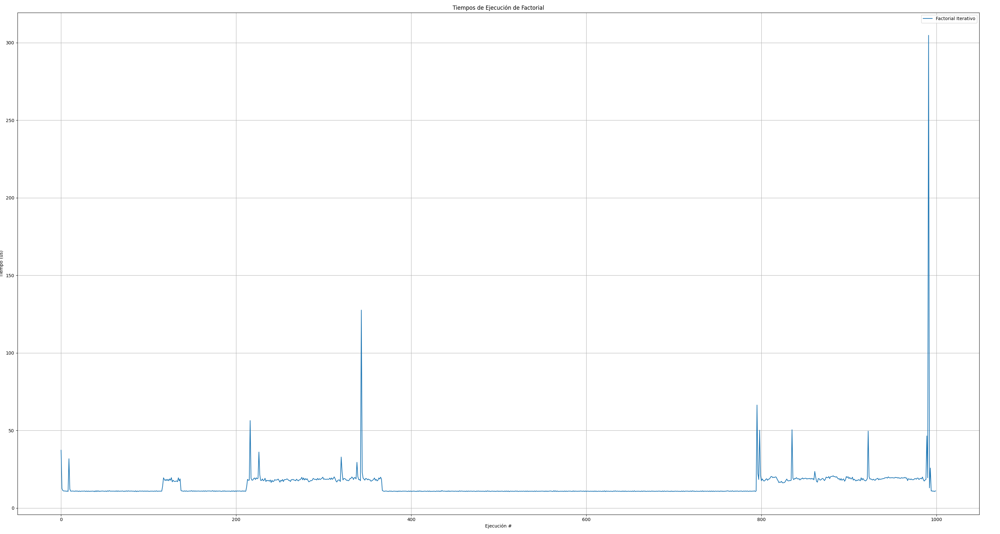

Gráfica obtenida en Google Colab

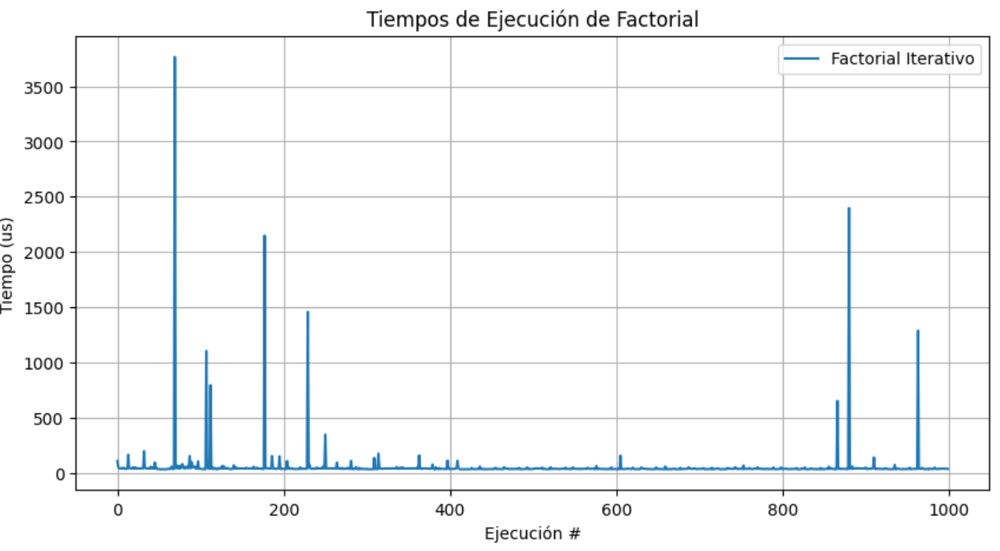

Como podemos observar se cumple lo mismo que para la experiencia anterior los piso de tiempo de ejecución son mayores en google colab que en la computadora local,igualmente obtenemos una gráfica más uniforme o con tiempo más estables para el caso de la computadora local.

***Experiencia 3)***

***Inciso a)***

In [42]:
! pip install cryptography

Defaulting to user installation because normal site-packages is not writeable


***Inciso b)***

In [44]:
from cryptography.hazmat.primitives.asymmetric import rsa
from cryptography.hazmat.primitives import serialization
from cryptography.hazmat.primitives.asymmetric import padding
from cryptography.hazmat.primitives import hashes
from cryptography.hazmat.primitives.ciphers import Cipher, algorithms, modes
from cryptography.hazmat.backends import default_backend

# Datos para cifrar
data = b"Este es el texto que vamos a cifrar. Es confidencial."

# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
print(f"Encrypted AES: {ct_aes}")
print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
print(f"Encrypted DES: {ct_des}")
print(f"Decrypted DES: {decrypted_des}")



Encrypted AES: b'7\xeb\xbe\xc0Efm\x8d\xa3\xa2\x03\xa6[\xde\x17\x17s8\x17Xo\xb4\'c\xe9\x8c[\x86\xc0\x87L\xe9\xd9\xb0\x00@\xa1"!N\x83\xe2\x03X\x1b\x04\xab\xfb0\xa6\x15\x1c\xb8'
Decrypted AES: b'Este es el texto que vamos a cifrar. Es confidencial.'
Encrypted DES: b'\x81\xdc%\xd8*j\xf9\xfdO,n\xfc\x93\xf6\xd8\x04\x9d\xa9\x9a\t\xa6\xb1)\x00\xca\xf8\xc5\xc2\xd0MU\xe0s\xed\x11\xddO3\xd7z)S|\xa9\xb8\x16\xc4*\r\xd5\x9cL\xd2'
Decrypted DES: b'Este es el texto que vamos a cifrar. Es confidencial.'


***Inciso c)***

Para 1MB

In [50]:
# Datos para cifrar
data = b"a"*1024*1024

# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
print(f"Encrypted AES: {ct_aes}")
print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
print(f"Encrypted DES: {ct_des}")
print(f"Decrypted DES: {decrypted_des}")


Encrypted AES: b'\x13\xf9\xab\xc4\x04b\x7f\xcc\xa7\xafB\xb3_\xc7\x02\x19\xb8\x93\xe6\x18\xfb\xc7S~\xfb\x8a\xe4\xe6\x95\xbe%\xed\x18\x8d\xf2\x97\xd2\xb1\x1eM\x1f\x13\xdb\xb2\xf8\xef\xc6\x19{\x86J\x1b\xe7\x83\xcd\x8dCb>\x99F\xc5:ND\xeb\xa4S\xe3*bFX\x9a\x8a\xf8}\x9f\xcd\xe8[l\xd6T\xc0\xcd\xfe\x82\r^t\xe3\x1frW^\x13]\n\xf9\xb8\xe6\x8f\xd3\xa1\xb5\x92t/\x83\xed\xe1X\xa2K\xf2\xc0\xab\x12\x92\xa9a\x8a\x14U\xf0r\x1b;\xf9\xd04\xe2{\xf7q\xb5\x17"\\Lf\xb5\x9d&\xa28bcgZ\xf2\xee]Wr\xf32\xea\xb5\xfa\xf1\xe4\x12d\xcc\xbd\x10\xf9o\xc9\xd5\xb5M\x9c(\x18S\xe78\xd3xi\xca\x10\x19\x7f\xe3|\xce\xfbQq\xf6\x87\xe7\xd5\x05\xdc\'\x82\x84\x9d\xcaJFh\x13ti\xf4\xa2\\T\xe8X\xa2\xea\x0c\x00\x11\x05v\xca\xf5\x80\xee\xf8\xa8nG?j\xb4\xea\xf4\xc3xF\xd3\xa8j\xae\x8b\x11\xf7\x16\xb9\x1a\\R\x02p;a\xfe\'\xcb\xe0\xa0\xb9\xd5h\x9a\xdeq~w\xf8\xc1$\x06\xbb\xbf\x9c\x99C\xb03\xf6\xaf\xa0\xbcs+kE;\xe5L\x89\x06\x1c\xea\x1b[K={\x04f\xe0P\x12\xf6p\xcb\xb6\xb0FT\xc01\xa3N\xdcdu+\xa8\xa9/r\xdd\xa7\xdae\xd7\xa8\xd3%\x96D\x12\xae\xb3s\x9

Para 100KB

In [49]:
# Datos para cifrar
data = b'a' * 1024 * 100  # 100 KB de datos
# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
print(f"Encrypted AES: {ct_aes}")
print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
print(f"Encrypted DES: {ct_des}")
print(f"Decrypted DES: {decrypted_des}")

Encrypted AES: b'\x13\xf9\xab\xc4\x04b\x7f\xcc\xa7\xafB\xb3_\xc7\x02\x19\xb8\x93\xe6\x18\xfb\xc7S~\xfb\x8a\xe4\xe6\x95\xbe%\xed\x18\x8d\xf2\x97\xd2\xb1\x1eM\x1f\x13\xdb\xb2\xf8\xef\xc6\x19{\x86J\x1b\xe7\x83\xcd\x8dCb>\x99F\xc5:ND\xeb\xa4S\xe3*bFX\x9a\x8a\xf8}\x9f\xcd\xe8[l\xd6T\xc0\xcd\xfe\x82\r^t\xe3\x1frW^\x13]\n\xf9\xb8\xe6\x8f\xd3\xa1\xb5\x92t/\x83\xed\xe1X\xa2K\xf2\xc0\xab\x12\x92\xa9a\x8a\x14U\xf0r\x1b;\xf9\xd04\xe2{\xf7q\xb5\x17"\\Lf\xb5\x9d&\xa28bcgZ\xf2\xee]Wr\xf32\xea\xb5\xfa\xf1\xe4\x12d\xcc\xbd\x10\xf9o\xc9\xd5\xb5M\x9c(\x18S\xe78\xd3xi\xca\x10\x19\x7f\xe3|\xce\xfbQq\xf6\x87\xe7\xd5\x05\xdc\'\x82\x84\x9d\xcaJFh\x13ti\xf4\xa2\\T\xe8X\xa2\xea\x0c\x00\x11\x05v\xca\xf5\x80\xee\xf8\xa8nG?j\xb4\xea\xf4\xc3xF\xd3\xa8j\xae\x8b\x11\xf7\x16\xb9\x1a\\R\x02p;a\xfe\'\xcb\xe0\xa0\xb9\xd5h\x9a\xdeq~w\xf8\xc1$\x06\xbb\xbf\x9c\x99C\xb03\xf6\xaf\xa0\xbcs+kE;\xe5L\x89\x06\x1c\xea\x1b[K={\x04f\xe0P\x12\xf6p\xcb\xb6\xb0FT\xc01\xa3N\xdcdu+\xa8\xa9/r\xdd\xa7\xdae\xd7\xa8\xd3%\x96D\x12\xae\xb3s\x9

Para 10KB

In [51]:
# Datos para cifrar
data = b'a' * 1024 * 10  # 10 KB de datos
# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
print(f"Encrypted AES: {ct_aes}")
print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
print(f"Encrypted DES: {ct_des}")
print(f"Decrypted DES: {decrypted_des}")

Encrypted AES: b'\x13\xf9\xab\xc4\x04b\x7f\xcc\xa7\xafB\xb3_\xc7\x02\x19\xb8\x93\xe6\x18\xfb\xc7S~\xfb\x8a\xe4\xe6\x95\xbe%\xed\x18\x8d\xf2\x97\xd2\xb1\x1eM\x1f\x13\xdb\xb2\xf8\xef\xc6\x19{\x86J\x1b\xe7\x83\xcd\x8dCb>\x99F\xc5:ND\xeb\xa4S\xe3*bFX\x9a\x8a\xf8}\x9f\xcd\xe8[l\xd6T\xc0\xcd\xfe\x82\r^t\xe3\x1frW^\x13]\n\xf9\xb8\xe6\x8f\xd3\xa1\xb5\x92t/\x83\xed\xe1X\xa2K\xf2\xc0\xab\x12\x92\xa9a\x8a\x14U\xf0r\x1b;\xf9\xd04\xe2{\xf7q\xb5\x17"\\Lf\xb5\x9d&\xa28bcgZ\xf2\xee]Wr\xf32\xea\xb5\xfa\xf1\xe4\x12d\xcc\xbd\x10\xf9o\xc9\xd5\xb5M\x9c(\x18S\xe78\xd3xi\xca\x10\x19\x7f\xe3|\xce\xfbQq\xf6\x87\xe7\xd5\x05\xdc\'\x82\x84\x9d\xcaJFh\x13ti\xf4\xa2\\T\xe8X\xa2\xea\x0c\x00\x11\x05v\xca\xf5\x80\xee\xf8\xa8nG?j\xb4\xea\xf4\xc3xF\xd3\xa8j\xae\x8b\x11\xf7\x16\xb9\x1a\\R\x02p;a\xfe\'\xcb\xe0\xa0\xb9\xd5h\x9a\xdeq~w\xf8\xc1$\x06\xbb\xbf\x9c\x99C\xb03\xf6\xaf\xa0\xbcs+kE;\xe5L\x89\x06\x1c\xea\x1b[K={\x04f\xe0P\x12\xf6p\xcb\xb6\xb0FT\xc01\xa3N\xdcdu+\xa8\xa9/r\xdd\xa7\xdae\xd7\xa8\xd3%\x96D\x12\xae\xb3s\x9

Para 1KB

In [52]:
# Datos para cifrar
data = b'a' * 1024 * 1 # 1 KB de datos
# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
print(f"Encrypted AES: {ct_aes}")
print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
print(f"Encrypted DES: {ct_des}")
print(f"Decrypted DES: {decrypted_des}")

Encrypted AES: b'\x13\xf9\xab\xc4\x04b\x7f\xcc\xa7\xafB\xb3_\xc7\x02\x19\xb8\x93\xe6\x18\xfb\xc7S~\xfb\x8a\xe4\xe6\x95\xbe%\xed\x18\x8d\xf2\x97\xd2\xb1\x1eM\x1f\x13\xdb\xb2\xf8\xef\xc6\x19{\x86J\x1b\xe7\x83\xcd\x8dCb>\x99F\xc5:ND\xeb\xa4S\xe3*bFX\x9a\x8a\xf8}\x9f\xcd\xe8[l\xd6T\xc0\xcd\xfe\x82\r^t\xe3\x1frW^\x13]\n\xf9\xb8\xe6\x8f\xd3\xa1\xb5\x92t/\x83\xed\xe1X\xa2K\xf2\xc0\xab\x12\x92\xa9a\x8a\x14U\xf0r\x1b;\xf9\xd04\xe2{\xf7q\xb5\x17"\\Lf\xb5\x9d&\xa28bcgZ\xf2\xee]Wr\xf32\xea\xb5\xfa\xf1\xe4\x12d\xcc\xbd\x10\xf9o\xc9\xd5\xb5M\x9c(\x18S\xe78\xd3xi\xca\x10\x19\x7f\xe3|\xce\xfbQq\xf6\x87\xe7\xd5\x05\xdc\'\x82\x84\x9d\xcaJFh\x13ti\xf4\xa2\\T\xe8X\xa2\xea\x0c\x00\x11\x05v\xca\xf5\x80\xee\xf8\xa8nG?j\xb4\xea\xf4\xc3xF\xd3\xa8j\xae\x8b\x11\xf7\x16\xb9\x1a\\R\x02p;a\xfe\'\xcb\xe0\xa0\xb9\xd5h\x9a\xdeq~w\xf8\xc1$\x06\xbb\xbf\x9c\x99C\xb03\xf6\xaf\xa0\xbcs+kE;\xe5L\x89\x06\x1c\xea\x1b[K={\x04f\xe0P\x12\xf6p\xcb\xb6\xb0FT\xc01\xa3N\xdcdu+\xa8\xa9/r\xdd\xa7\xdae\xd7\xa8\xd3%\x96D\x12\xae\xb3s\x9

***Inciso e)***

In [53]:
# Datos para cifrar
#Para 1MB
data = b"a"*1024*1024

# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
tic=time.perf_counter()
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
#print(f"Encrypted AES: {ct_aes}")
#print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
#print(f"Encrypted DES: {ct_des}")
#print(f"Decrypted DES: {decrypted_des}")

#Para 100KB
# Datos para cifrar
data = b"a"*1024*100

# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
#print(f"Encrypted AES: {ct_aes}")
#print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
#print(f"Encrypted DES: {ct_des}")
#print(f"Decrypted DES: {decrypted_des}")

#Para 10KB
# Datos para cifrar
data = b"a"*1024*10

# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
#print(f"Encrypted AES: {ct_aes}")
#print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
#print(f"Encrypted DES: {ct_des}")
#print(f"Decrypted DES: {decrypted_des}")

#Para 1KB
# Datos para cifrar
data = b"a"*1024*1

# Ejemplo de uso
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
#print(f"Encrypted AES: {ct_aes}")
#print(f"Decrypted AES: {decrypted_aes}")

ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
#print(f"Encrypted DES: {ct_des}")
#print(f"Decrypted DES: {decrypted_des}")

toc=time.perf_counter()
dif_tiempo=(1e6*(toc-tic))
print("El tiempo que tarde en ejecutar todo en us es: ")
print(dif_tiempo)


El tiempo que tarde en ejecutar todo en us es: 
66483.92200077069


***Inciso f y g)***

Al momento de ejecutar en colab ,obtenemos el siguiente tiempo de ejecución.
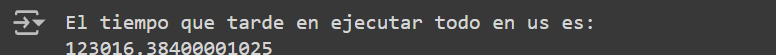

***Inciso h)***

Elegimos el archivo de 100KB

In [54]:
# Datos para cifrar
data = b'a' * 1024 * 100  # 100 KB de datos
# AES
def aes_encryption(data):
    key = b'\x01'*32  # Clave AES de 256 bits
    iv = b'\x00'*16   # Vector de inicialización
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def aes_decryption(ct):
    key = b'\x01'*32
    iv = b'\x00'*16
    cipher = Cipher(algorithms.AES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted

# DES
def des_encryption(data):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    encryptor = cipher.encryptor()
    ct = encryptor.update(data) + encryptor.finalize()
    return ct

def des_decryption(ct):
    key = b'\x02'*8
    iv = b'\x00'*8
    cipher = Cipher(algorithms.TripleDES(key), modes.CFB(iv), backend=default_backend())
    decryptor = cipher.decryptor()
    decrypted = decryptor.update(ct) + decryptor.finalize()
    return decrypted



# Ejemplo de uso
tic1=time.perf_counter()
ct_aes = aes_encryption(data)
decrypted_aes = aes_decryption(ct_aes)
toc1=time.perf_counter()
dif1=1e6*(toc1-tic1)
print("El tiempo que le toma a la primera función es: ")
print(dif1)
#print(f"Encrypted AES: {ct_aes}")
#print(f"Decrypted AES: {decrypted_aes}")



tic2=time.perf_counter()
ct_des = des_encryption(data)
decrypted_des = des_decryption(ct_des)
toc2=time.perf_counter()
dif2=1e6*(toc2-tic2)
print("El tiempo que le toma a la segunda función es: ")
print(dif2)
#print(f"Encrypted DES: {ct_des}")
#print(f"Decrypted DES: {decrypted_des}")

El tiempo que le toma a la primera función es: 
1384.2069984093541
El tiempo que le toma a la segunda función es: 
6243.5349991574185


Podemos observar que la primera función presenta un mejor performance debido a que tiene un menor tiempo de ejecución.